# IMPORTS

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math
import glob
import re
from matplotlib.patches import ConnectionPatch

In [2]:
project_root = '/home/davidboja/PycharmProjects/FER/hpatches-benchmark/python/ISPA'

# LOAD IMAGES

In [3]:
images = glob.glob(project_root + '/hpatches-sequences-release/v_london/*.ppm')
transformations = glob.glob(project_root + '/hpatches-sequences-release/v_london/H*')

In [4]:
images = sorted(images)
transformations = sorted(transformations)

In [5]:
images

['/home/davidboja/PycharmProjects/FER/hpatches-benchmark/python/ISPA/hpatches-sequences-release/v_london/1.ppm',
 '/home/davidboja/PycharmProjects/FER/hpatches-benchmark/python/ISPA/hpatches-sequences-release/v_london/2.ppm',
 '/home/davidboja/PycharmProjects/FER/hpatches-benchmark/python/ISPA/hpatches-sequences-release/v_london/3.ppm',
 '/home/davidboja/PycharmProjects/FER/hpatches-benchmark/python/ISPA/hpatches-sequences-release/v_london/4.ppm',
 '/home/davidboja/PycharmProjects/FER/hpatches-benchmark/python/ISPA/hpatches-sequences-release/v_london/5.ppm',
 '/home/davidboja/PycharmProjects/FER/hpatches-benchmark/python/ISPA/hpatches-sequences-release/v_london/6.ppm']

In [6]:
transformations

['/home/davidboja/PycharmProjects/FER/hpatches-benchmark/python/ISPA/hpatches-sequences-release/v_london/H_1_2',
 '/home/davidboja/PycharmProjects/FER/hpatches-benchmark/python/ISPA/hpatches-sequences-release/v_london/H_1_3',
 '/home/davidboja/PycharmProjects/FER/hpatches-benchmark/python/ISPA/hpatches-sequences-release/v_london/H_1_4',
 '/home/davidboja/PycharmProjects/FER/hpatches-benchmark/python/ISPA/hpatches-sequences-release/v_london/H_1_5',
 '/home/davidboja/PycharmProjects/FER/hpatches-benchmark/python/ISPA/hpatches-sequences-release/v_london/H_1_6']

In [7]:
images = [cv2.imread(im) for im in images]

# FIND SIFT KEYPOINTS ON FIRST IMAGE

### LOAD FIRST IMAGE

In [8]:
image0 = images[0]

In [10]:
image0.shape

(914, 1380, 3)

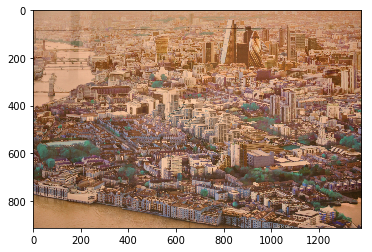

In [13]:
plt.imshow(image0)
plt.show()

### SIFT KEYPOINTS

In [21]:
gray= cv2.cvtColor(image0,cv2.COLOR_RGB2GRAY)

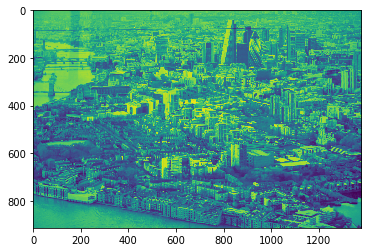

In [22]:
plt.imshow(gray)
plt.show()

In [23]:
sift = cv2.xfeatures2d.SIFT_create()
kp = sift.detect(gray, None)

In [35]:
gray_with_kp = cv2.drawKeypoints(gray,kp, cv2.DRAW_MATCHES_FLAGS_DEFAULT)

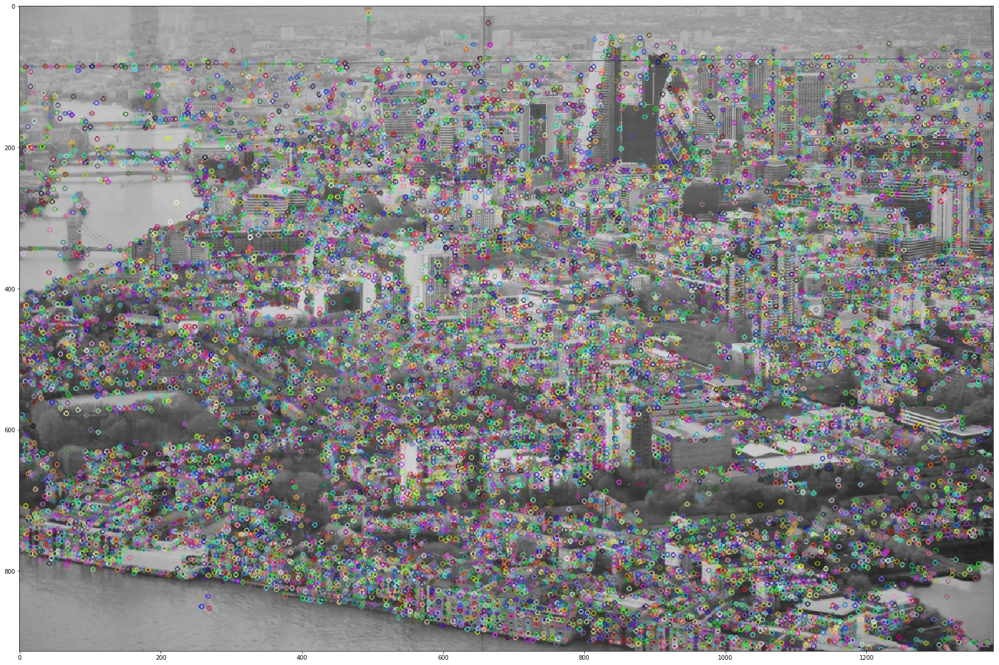

In [36]:
plt.figure(figsize=(30,30))
plt.imshow(gray_with_kp)
plt.show()

# REMOVE OVERLAPPING PATCHES

In [37]:
patch_size = (16,16)

In [245]:
def calculate_overlapping_area1(patch1_center,patch2_center,patch_size=(16,16)):
    '''
    Calculate the overlapping patch area for given 2 patch center cordinates.
    Assumption: patch_size is square
    '''
    
    patch_size_halved = tuple(x/2 for x in patch_size)
    
    patch1_l = tuple(np.subtract(patch1_center, patch_size_halved))
    patch1_r = tuple(np.add(patch1_center,patch_size_halved))
    patch2_l = tuple(np.subtract(patch2_center, patch_size_halved))
    patch2_r = tuple(np.add(patch2_center, patch_size_halved))
    
    area = (min(patch1_r[0], patch2_r[0]) -  
            max(patch1_l[0], patch2_l[0])) * \
            (max(patch1_r[1], patch2_r[1]) -
             min(patch1_l[1],patch2_l[1]))
    
#     area_patch1 = abs(patch1_l[0]-patch1_r[0])*abs(patch1_l[1]-patch1_r[1])
#     area_patch2 = abs(patch2_l[0]-patch2_r[0])*abs(patch2_l[1]-patch2_r[1])

    area_patches = patch_size[0]**2
    
    return area / (2*area_patches - area)
    

In [260]:
(1,2)[0] + 

1

In [261]:
def calculate_overlapping_area2(patch1_center,patch2_center,patch_size=(16,16)):
    '''
    Calculate the overlapping patch area for given 2 patch center cordinates.
    Assumption: patch_size is square
    '''
    
    patch_size_halved = tuple(x/2 for x in patch_size)
    
    patch1_l = tuple((patch1_center[0] - patch_size_halved[0], patch1_center[1] + patch_size_halved[1])
    patch1_r = tuple(patch1_center[0] + patch_size_halved[0], patch1_center[1] - patch_size_halved[1])
    patch2_l = tuple(patch2_center[0] - patch_size_halved[0], patch2_center[1] + patch_size_halved[1])
    patch2_r = tuple(patch2_center[0] + patch_size_halved[0], patch2_center[1] - patch_size_halved[1])
    
    area = (min(patch1_r[0], patch2_r[0]) -  
            max(patch1_l[0], patch2_l[0])) * \
            (max(patch1_r[1], patch2_r[1]) -
             min(patch1_l[1],patch2_l[1]))
    
#     area_patch1 = abs(patch1_l[0]-patch1_r[0])*abs(patch1_l[1]-patch1_r[1])
#     area_patch2 = abs(patch2_l[0]-patch2_r[0])*abs(patch2_l[1]-patch2_r[1])

    area_patches = patch_size[0]**2
    
    return area / (2*area_patches - area)
    

SyntaxError: invalid syntax (<ipython-input-261-551d1afd4371>, line 10)

In [259]:
#ex = 0.14285714285714285: overlapping area je 25, area svakog je 100 --> 25/175
# to je prije radilo, sad smo zamijenili y os da ide obratno jer je tako na slikama
calculate_overlapping_area2((5,5),(10,10),(10,10))

TypeError: tuple() takes at most 1 argument (2 given)

In [209]:
len(kp)

19291

In [247]:
unique_points = set()
added_coordinates = set()
for k in kp:
    if k.pt not in added_coordinates:
        unique_points.add(k)
        added_coordinates.add(k.pt)

In [248]:
len(unique_points)

15691

In [249]:
unique_points = list(unique_points)

### PRVI NACIN

In [250]:
last_index = len(unique_points)-1

for id1, point1 in enumerate(unique_points):
    print(id1)
    if id1 == last_index:
        break
    for id2, point2 in enumerate(unique_points[(id1+1):last_index]):
        while(calculate_overlapping_area(point1.pt,point2.pt) > 0.5):
            print(id1,id2, last_index)
            unique_points[id1+id2+1], unique_points[last_index] = unique_points[last_index], unique_points[id1+id2+1]
            last_index -= 1
            point2 = unique_points[id1+id2+1]

0
0 25 15690
0 55 15689
0 63 15688
0 65 15687
0 86 15686
0 93 15685
0 100 15684
0 110 15683
0 111 15682
0 118 15681
0 148 15680
0 151 15679
0 158 15678
0 160 15677
0 164 15676
0 172 15675
0 181 15674
0 187 15673
0 192 15672
0 198 15671
0 201 15670
0 203 15669
0 204 15668
0 206 15667
0 207 15666
0 210 15665
0 211 15664
0 213 15663
0 215 15662
0 216 15661
0 219 15660
0 220 15659
0 222 15658
0 224 15657
0 15486 15656
0 15491 15655
0 15491 15654
0 15492 15653
0 15494 15652
0 15495 15651
0 15498 15650
0 15503 15649
0 15504 15648
0 15505 15647
0 15506 15646
0 15508 15645
0 15513 15644
0 15529 15643
0 15536 15642
0 15539 15641
0 15556 15640
0 15559 15639
0 15563 15638
0 15573 15637
0 15596 15636
0 15599 15635
0 15604 15634
0 15610 15633
0 15654 15632
1
1 8 15631
1 12 15630
1 17 15629
1 58 15628
1 87 15627
1 89 15626
1 89 15625
1 115 15624
1 116 15623
1 125 15622
1 152 15621
1 166 15620
1 170 15619
1 173 15618
1 179 15617
1 181 15616
1 193 15615
1 198 15614
1 199 15613
1 201 15612
1 207 15611


16
16 40 15044
17
17 66 15043
17 67 15042
17 69 15041
17 79 15040
17 94 15039
17 104 15038
17 106 15037
17 111 15036
17 127 15035
17 136 15034
17 157 15033
17 163 15032
17 225 15031
17 228 15030
17 230 15029
17 231 15028
17 232 15027
17 233 15026
18
18 16 15025
18 40 15024
18 50 15023
18 65 15022
18 82 15021
18 96 15020
18 99 15019
18 115 15018
18 121 15017
18 138 15016
18 140 15015
18 141 15014
18 141 15013
18 144 15012
18 172 15011
18 196 15010
18 205 15009
18 209 15008
18 14842 15007
18 14842 15006
18 14881 15005
18 14887 15004
18 14891 15003
18 14922 15002
18 14935 15001
18 14947 15000
18 14951 14999
18 14956 14998
18 14959 14997
18 14988 14996
18 14995 14995
19
19 21 14994
19 22 14993
19 29 14992
19 32 14991
19 35 14990
19 66 14989
19 148 14988
19 180 14987
19 215 14986
19 14755 14985
20
20 32 14984
20 68 14983
20 74 14982
20 84 14981
20 89 14980
20 109 14979
20 118 14978
20 120 14977
20 150 14976
20 173 14975
20 176 14974
20 180 14973
20 183 14972
20 185 14971
20 187 14970
20 189

52
52 20 14440
52 41 14439
52 60 14438
52 71 14437
52 78 14436
52 80 14435
52 80 14434
52 82 14433
52 82 14432
52 84 14431
52 89 14430
52 89 14429
52 116 14428
52 140 14427
52 192 14426
52 192 14425
52 200 14424
52 200 14423
52 203 14422
52 204 14421
52 14050 14420
52 14050 14419
52 14054 14418
52 14054 14417
52 14054 14416
52 14120 14415
52 14321 14414
52 14332 14413
52 14351 14412
52 14364 14411
52 14365 14410
52 14367 14409
52 14371 14408
52 14373 14407
52 14377 14406
52 14380 14405
52 14382 14404
53
53 4 14403
53 18 14402
53 44 14401
53 50 14400
53 81 14399
53 86 14398
53 112 14397
53 113 14396
53 128 14395
53 128 14394
53 138 14393
53 144 14392
53 147 14391
53 156 14390
53 204 14389
53 209 14388
53 14057 14387
53 14072 14386
53 14098 14385
53 14101 14384
53 14108 14383
53 14169 14382
53 14169 14381
53 14194 14380
53 14325 14379
53 14325 14378
53 14328 14377
53 14341 14376
54
54 145 14375
54 199 14374
55
55 11 14373
55 63 14372
55 159 14371
55 14068 14370
56
56 49 14369
57
57 39 14

84 13482 13846
84 13763 13845
85
85 3 13844
85 53 13843
85 63 13842
85 111 13841
86
86 1 13840
86 18 13839
86 94 13838
86 140 13837
86 143 13836
86 149 13835
86 150 13834
86 164 13833
86 182 13832
87
87 38 13831
87 38 13830
87 50 13829
87 53 13828
87 65 13827
87 117 13826
87 126 13825
87 143 13824
87 143 13823
87 154 13822
87 164 13821
87 164 13820
87 180 13819
87 199 13818
87 13504 13817
87 13504 13816
87 13546 13815
87 13578 13814
87 13684 13813
87 13690 13812
87 13697 13811
87 13708 13810
87 13710 13809
87 13714 13808
87 13717 13807
87 13729 13806
87 13733 13805
87 13736 13804
88
88 39 13803
88 41 13802
88 59 13801
88 86 13800
88 144 13799
88 154 13798
88 173 13797
88 174 13796
88 238 13795
88 13288 13794
88 13290 13793
88 13295 13792
88 13297 13791
88 13299 13790
88 13300 13789
88 13302 13788
88 13306 13787
88 13307 13786
88 13319 13785
88 13322 13784
88 13327 13783
88 13334 13782
88 13338 13781
88 13343 13780
88 13345 13779
88 13352 13778
88 13355 13777
88 13358 13776
88 13360 137

127 13141 13269
127 13141 13268
127 13147 13267
128
128 19 13266
128 36 13265
128 48 13264
128 88 13263
128 116 13262
128 125 13261
128 172 13260
128 12909 13259
128 12910 13258
128 12912 13257
128 12915 13256
128 12917 13255
128 12921 13254
128 12926 13253
128 12929 13252
128 12934 13251
128 12949 13250
128 12954 13249
128 12957 13248
128 12964 13247
128 12973 13246
128 12975 13245
128 12993 13244
128 13019 13243
129
129 31 13242
129 127 13241
130
130 31 13240
130 31 13239
130 37 13238
130 94 13237
130 96 13236
130 109 13235
130 158 13234
130 12944 13233
130 12944 13232
130 12951 13231
130 12955 13230
130 12979 13229
130 12983 13228
130 12992 13227
130 13016 13226
130 13021 13225
130 13023 13224
130 13041 13223
130 13044 13222
130 13050 13221
130 13071 13220
130 13102 13219
131
131 48 13218
131 168 13217
132
133
133 81 13216
133 84 13215
133 12907 13214
134
134 105 13213
134 120 13212
134 150 13211
134 163 13210
134 12911 13209
134 12923 13208
134 12938 13207
134 12956 13206
134 12975

171 12513 12718
172
173
173 1 12717
173 29 12716
173 60 12715
173 63 12714
173 67 12713
173 80 12712
173 89 12711
173 102 12710
173 12318 12709
173 12349 12708
173 12517 12707
174
174 1088 12706
174 1178 12705
174 1204 12704
174 12229 12703
174 12233 12702
174 12235 12701
174 12237 12700
174 12239 12699
174 12239 12698
174 12240 12697
174 12244 12696
174 12253 12695
174 12281 12694
174 12287 12693
174 12292 12692
174 12305 12691
174 12308 12690
174 12321 12689
174 12335 12688
174 12339 12687
174 12355 12686
174 12360 12685
174 12385 12684
174 12425 12683
174 12524 12682
175
175 74 12681
175 86 12680
175 141 12679
175 143 12678
175 12122 12677
175 12127 12676
175 12130 12675
175 12132 12674
175 12135 12673
175 12137 12672
175 12141 12671
175 12153 12670
175 12157 12669
175 12161 12668
175 12168 12667
175 12175 12666
175 12186 12665
175 12191 12664
175 12192 12663
175 12205 12662
175 12215 12661
175 12224 12660
175 12225 12659
175 12250 12658
175 12261 12657
175 12265 12656
175 12272 126

215 11725 12193
215 11730 12192
215 11732 12191
215 11737 12190
215 11740 12189
215 11742 12188
215 11744 12187
215 11752 12186
215 11754 12185
215 11756 12184
215 11762 12183
215 11764 12182
215 11770 12181
215 11772 12180
215 11774 12179
215 11776 12178
215 11782 12177
215 11797 12176
215 11799 12175
215 11820 12174
215 11825 12173
215 11829 12172
215 11830 12171
215 11837 12170
215 11844 12169
215 11848 12168
215 11849 12167
215 11851 12166
215 11855 12165
215 11922 12164
215 11983 12163
216
216 8 12162
216 8 12161
216 1070 12160
216 1115 12159
216 11914 12158
217
217 22 12157
217 26 12156
217 1057 12155
217 1139 12154
217 1284 12153
217 11805 12152
217 11847 12151
217 11849 12150
217 11851 12149
217 11894 12148
217 11901 12147
217 11904 12146
217 11910 12145
217 11911 12144
217 11911 12143
217 11915 12142
217 11926 12141
218
218 35 12140
218 1059 12139
218 1122 12138
218 1143 12137
218 1285 12136
218 1287 12135
218 1306 12134
219
220
220 29 12133
221
221 10 12132
221 62 12131
221 1

254 11206 11644
254 11216 11643
254 11219 11642
254 11221 11641
254 11225 11640
254 11227 11639
254 11232 11638
254 11255 11637
254 11259 11636
254 11262 11635
254 11273 11634
254 11279 11633
254 11299 11632
254 11323 11631
254 11329 11630
254 11335 11629
254 11371 11628
254 11392 11627
254 11396 11626
255
256
256 0 11625
256 44 11624
256 58 11623
256 1003 11622
256 1075 11621
256 11280 11620
256 11284 11619
256 11284 11618
256 11285 11617
256 11288 11616
256 11293 11615
256 11295 11614
256 11297 11613
256 11299 11612
256 11302 11611
256 11310 11610
256 11310 11609
256 11315 11608
256 11315 11607
256 11322 11606
256 11324 11605
256 11326 11604
256 11327 11603
256 11329 11602
256 11330 11601
256 11332 11600
256 11342 11599
256 11342 11598
256 11351 11597
256 11353 11596
256 11362 11595
257
257 1002 11594
257 1049 11593
257 1049 11592
257 1252 11591
257 10938 11590
257 10938 11589
257 10940 11588
257 10950 11587
257 10954 11586
257 10961 11585
257 10963 11584
257 10966 11583
257 10968 11

299 10605 11087
299 10622 11086
299 10622 11085
299 10662 11084
299 10664 11083
299 10711 11082
299 10726 11081
299 10731 11080
299 10741 11079
299 10745 11078
299 10786 11077
299 10814 11076
300
300 21 11075
300 31 11074
300 32 11073
300 127 11072
300 177 11071
300 181 11070
300 1187 11069
301
301 72 11068
301 83 11067
301 85 11066
301 102 11065
301 127 11064
301 129 11063
301 155 11062
301 188 11061
301 1003 11060
301 1035 11059
301 1064 11058
301 1182 11057
301 1200 11056
301 1200 11055
301 1223 11054
301 10516 11053
301 10518 11052
301 10520 11051
301 10524 11050
301 10529 11049
301 10533 11048
301 10535 11047
301 10537 11046
301 10547 11045
301 10548 11044
301 10550 11043
301 10554 11042
301 10556 11041
301 10589 11040
301 10591 11039
301 10593 11038
301 10593 11037
301 10605 11036
301 10608 11035
301 10616 11034
301 10630 11033
301 10637 11032
301 10642 11031
301 10654 11030
301 10654 11029
301 10675 11028
301 10716 11027
301 10728 11026
301 10736 11025
301 10754 11024
302
302 23

332 10025 10523
332 10025 10522
332 10109 10521
332 10109 10520
332 10188 10519
332 10190 10518
332 10197 10517
332 10199 10516
332 10204 10515
332 10208 10514
333
333 14 10513
333 19 10512
333 25 10511
333 25 10510
333 31 10509
333 50 10508
333 56 10507
333 65 10506
333 128 10505
333 129 10504
333 135 10503
333 152 10502
333 164 10501
333 191 10500
333 203 10499
333 208 10498
333 1176 10497
333 1201 10496
333 1204 10495
333 9983 10494
333 10177 10493
334
334 4 10492
334 62 10491
334 212 10490
334 218 10489
334 220 10488
335
335 30 10487
335 37 10486
335 46 10485
335 94 10484
335 110 10483
335 123 10482
335 139 10481
335 152 10480
335 174 10479
335 204 10478
335 205 10477
335 962 10476
335 969 10475
335 1047 10474
335 1133 10473
335 1159 10472
335 9942 10471
335 9964 10470
335 10028 10469
336
336 14 10468
336 50 10467
336 52 10466
336 52 10465
336 79 10464
336 81 10463
336 87 10462
336 91 10461
336 131 10460
336 131 10459
336 131 10458
336 149 10457
336 151 10456
336 151 10455
336 203 

359 9458 9948
359 9549 9947
360
360 19 9946
360 51 9945
360 206 9944
360 212 9943
360 213 9942
360 215 9941
360 217 9940
360 218 9939
361
361 62 9938
361 89 9937
361 101 9936
361 103 9935
361 103 9934
361 103 9933
361 151 9932
361 151 9931
361 153 9930
361 153 9929
361 197 9928
361 204 9927
361 993 9926
361 993 9925
361 1140 9924
361 1165 9923
361 1176 9922
361 1176 9921
361 1176 9920
361 9477 9919
361 9538 9918
361 9539 9917
361 9546 9916
361 9548 9915
361 9548 9914
361 9549 9913
361 9549 9912
361 9551 9911
361 9553 9910
361 9559 9909
361 9560 9908
361 9564 9907
361 9568 9906
361 9570 9905
361 9572 9904
361 9573 9903
362
362 3 9902
362 43 9901
362 65 9900
362 135 9899
362 196 9898
362 1012 9897
362 1139 9896
362 9362 9895
362 9364 9894
362 9368 9893
362 9377 9892
362 9379 9891
362 9390 9890
362 9426 9889
362 9448 9888
362 9448 9887
362 9525 9886
363
363 9 9885
363 13 9884
363 25 9883
363 43 9882
363 82 9881
363 97 9880
363 122 9879
363 127 9878
363 143 9877
363 150 9876
363 161 9875
3

401
401 5 9322
401 18 9321
401 66 9320
401 72 9319
401 89 9318
401 117 9317
401 161 9316
401 1117 9315
401 1125 9314
401 8742 9313
401 8752 9312
401 8754 9311
401 8756 9310
401 8760 9309
401 8762 9308
401 8764 9307
401 8772 9306
401 8774 9305
401 8778 9304
401 8785 9303
401 8791 9302
401 8800 9301
401 8809 9300
401 8832 9299
401 8832 9298
401 8835 9297
401 8844 9296
401 8885 9295
401 8897 9294
402
402 13 9293
402 39 9292
402 95 9291
402 161 9290
402 175 9289
402 8805 9288
402 8814 9287
402 8836 9286
403
403 68 9285
403 958 9284
403 1077 9283
404
405
405 39 9282
405 60 9281
405 149 9280
405 155 9279
405 164 9278
405 877 9277
405 933 9276
406
406 45 9275
406 60 9274
406 65 9273
406 91 9272
406 120 9271
406 151 9270
406 172 9269
406 177 9268
406 894 9267
406 1047 9266
406 1101 9265
406 8682 9264
406 8687 9263
406 8689 9262
406 8691 9261
406 8694 9260
406 8713 9259
406 8741 9258
406 8742 9257
406 8777 9256
406 8779 9255
406 8782 9254
406 8841 9253
406 8841 9252
406 8846 9251
407
407 17 925

443 33 8706
443 58 8705
443 83 8704
443 120 8703
443 122 8702
443 132 8701
443 135 8700
443 138 8699
443 839 8698
443 902 8697
443 1066 8696
443 1083 8695
443 7992 8694
443 7999 8693
443 8045 8692
443 8116 8691
443 8124 8690
443 8136 8689
443 8141 8688
443 8171 8687
443 8177 8686
443 8194 8685
444
444 15 8684
444 50 8683
444 76 8682
444 88 8681
444 180 8680
444 831 8679
444 892 8678
444 915 8677
444 917 8676
444 938 8675
444 1009 8674
444 1063 8673
444 1088 8672
444 8134 8671
444 8225 8670
444 8225 8669
445
445 5 8668
445 13 8667
445 27 8666
445 39 8665
445 87 8664
445 121 8663
445 129 8662
445 146 8661
445 175 8660
445 830 8659
445 857 8658
445 1012 8657
445 1077 8656
445 1087 8655
445 7985 8654
445 8005 8653
445 8018 8652
445 8098 8651
445 8139 8650
445 8175 8649
446
446 49 8648
446 65 8647
446 175 8646
446 899 8645
446 906 8644
446 936 8643
446 1022 8642
446 1080 8641
446 8018 8640
446 8044 8639
446 8121 8638
446 8174 8637
446 8185 8636
447
447 78 8635
447 91 8634
447 895 8633
447 9

490
490 31 8106
490 38 8105
491
491 53 8104
491 63 8103
491 94 8102
491 96 8101
491 854 8100
491 981 8099
491 7582 8098
492
492 41 8097
492 57 8096
492 57 8095
492 64 8094
492 89 8093
492 803 8092
492 1004 8091
492 1009 8090
492 1040 8089
492 7318 8088
492 7336 8087
492 7351 8086
492 7369 8085
492 7380 8084
492 7382 8083
492 7393 8082
492 7444 8081
492 7454 8080
492 7454 8079
492 7469 8078
492 7474 8077
492 7496 8076
492 7587 8075
492 7603 8074
493
493 18 8073
493 30 8072
493 30 8071
493 32 8070
493 44 8069
493 70 8068
493 80 8067
493 80 8066
493 83 8065
493 85 8064
493 125 8063
493 966 8062
493 7423 8061
493 7439 8060
493 7447 8059
493 7487 8058
493 7541 8057
493 7546 8056
493 7550 8055
493 7573 8054
493 7578 8053
494
494 980 8052
495
495 5 8051
495 69 8050
495 70 8049
495 75 8048
495 85 8047
495 855 8046
495 1016 8045
495 7533 8044
496
496 78 8043
496 858 8042
496 1045 8041
496 7320 8040
496 7322 8039
496 7349 8038
496 7354 8037
496 7358 8036
496 7370 8035
496 7380 8034
496 7387 8033

533
533 15 7488
533 33 7487
533 90 7486
533 135 7485
533 177 7484
533 180 7483
533 924 7482
533 6834 7481
533 6866 7480
533 6868 7479
533 6876 7478
533 6879 7477
533 6881 7476
533 6884 7475
533 6886 7474
533 6892 7473
533 6893 7472
533 6897 7471
533 6898 7470
533 6917 7469
533 6931 7468
534
534 3 7467
534 35 7466
534 51 7465
534 84 7464
534 925 7463
534 6903 7462
535
535 13 7461
535 29 7460
535 34 7459
535 34 7458
535 39 7457
535 41 7456
535 1002 7455
535 6824 7454
535 6826 7453
535 6835 7452
535 6845 7451
535 6869 7450
535 6875 7449
535 6885 7448
535 6892 7447
535 6923 7446
536
536 16 7445
537
537 44 7444
537 805 7443
537 1004 7442
538
538 6580 7441
538 6586 7440
538 6589 7439
538 6594 7438
538 6605 7437
538 6612 7436
538 6614 7435
538 6627 7434
538 6632 7433
538 6632 7432
538 6634 7431
538 6635 7430
538 6650 7429
538 6662 7428
538 6668 7427
538 6690 7426
538 6692 7425
538 6693 7424
538 6695 7423
538 6715 7422
538 6737 7421
538 6753 7420
538 6759 7419
538 6779 7418
538 6842 7417
538 6

585
585 8 6884
585 55 6883
585 58 6882
585 60 6881
585 72 6880
585 82 6879
585 95 6878
585 122 6877
585 135 6876
585 136 6875
585 137 6874
585 138 6873
585 145 6872
585 146 6871
585 147 6870
585 148 6869
585 149 6868
585 151 6867
585 152 6866
585 153 6865
585 155 6864
585 157 6863
585 158 6862
585 159 6861
585 163 6860
585 165 6859
585 166 6858
585 168 6857
585 169 6856
585 170 6855
585 171 6854
586
586 779 6853
586 876 6852
586 897 6851
586 930 6850
586 940 6849
586 6130 6848
586 6196 6847
586 6227 6846
587
587 6 6845
587 70 6844
587 126 6843
587 153 6842
587 749 6841
587 866 6840
587 872 6839
587 5983 6838
587 5992 6837
587 6000 6836
587 6030 6835
587 6034 6834
587 6035 6833
587 6037 6832
587 6058 6831
587 6063 6830
587 6064 6829
587 6072 6828
587 6093 6827
587 6118 6826
587 6131 6825
587 6138 6824
587 6142 6823
587 6162 6822
587 6175 6821
587 6177 6820
587 6193 6819
587 6196 6818
588
588 142 6817
588 156 6816
588 757 6815
588 796 6814
588 5999 6813
588 6130 6812
588 6174 6811
588 61

629 5477 6269
629 5479 6268
629 5488 6267
629 5490 6266
629 5494 6265
629 5494 6264
629 5497 6263
629 5499 6262
629 5501 6261
629 5505 6260
629 5517 6259
629 5517 6258
629 5534 6257
629 5536 6256
629 5566 6255
629 5574 6254
629 5578 6253
629 5605 6252
629 5629 6251
629 5635 6250
629 5641 6249
629 5644 6248
629 5645 6247
630
630 2 6246
630 7 6245
630 78 6244
630 79 6243
630 680 6242
630 888 6241
631
631 10 6240
631 23 6239
631 70 6238
631 77 6237
631 83 6236
631 88 6235
631 104 6234
631 159 6233
631 874 6232
631 5515 6231
632
632 4 6230
632 13 6229
632 16 6228
632 22 6227
632 35 6226
632 59 6225
632 59 6224
632 64 6223
632 92 6222
632 132 6221
632 133 6220
632 172 6219
632 851 6218
632 851 6217
632 879 6216
632 5459 6215
632 5464 6214
632 5468 6213
632 5470 6212
632 5504 6211
632 5507 6210
632 5509 6209
632 5526 6208
632 5537 6207
632 5573 6206
632 5573 6205
632 5585 6204
632 5592 6203
633
633 14 6202
633 25 6201
633 33 6200
633 40 6199
633 52 6198
633 56 6197
633 68 6196
633 79 6195
63

664 4946 5660
664 4984 5659
665
665 19 5658
665 57 5657
665 133 5656
665 137 5655
665 645 5654
666
666 19 5653
666 30 5652
666 46 5651
666 79 5650
666 87 5649
666 98 5648
666 629 5647
666 718 5646
666 787 5645
666 841 5644
666 843 5643
666 4918 5642
666 4936 5641
666 4942 5640
667
667 1 5639
667 57 5638
667 4825 5637
668
668 2 5636
668 44 5635
668 47 5634
668 102 5633
668 109 5632
668 120 5631
668 181 5630
668 611 5629
668 791 5628
668 4834 5627
668 4903 5626
668 4921 5625
668 4925 5624
668 4952 5623
669
669 0 5622
669 28 5621
669 102 5620
669 147 5619
669 166 5618
669 178 5617
669 181 5616
669 696 5615
670
670 74 5614
670 82 5613
670 152 5612
670 165 5611
670 695 5610
670 4592 5609
670 4597 5608
670 4599 5607
670 4602 5606
670 4604 5605
670 4610 5604
670 4614 5603
670 4620 5602
670 4625 5601
670 4630 5600
670 4633 5599
670 4635 5598
670 4647 5597
670 4658 5596
670 4660 5595
670 4661 5594
670 4672 5593
670 4677 5592
670 4681 5591
670 4703 5590
670 4706 5589
670 4717 5588
670 4723 5587


706 99 5047
706 112 5046
706 114 5045
706 119 5044
706 119 5043
706 119 5042
706 143 5041
706 148 5040
706 671 5039
706 671 5038
706 816 5037
706 4166 5036
706 4173 5035
706 4203 5034
706 4245 5033
706 4254 5032
706 4254 5031
706 4295 5030
706 4309 5029
706 4309 5028
706 4322 5027
706 4325 5026
706 4332 5025
706 4336 5024
706 4337 5023
707
707 22 5022
707 22 5021
707 51 5020
707 76 5019
707 90 5018
707 110 5017
707 120 5016
707 161 5015
707 603 5014
707 663 5013
707 4172 5012
707 4192 5011
707 4200 5010
707 4206 5009
707 4208 5008
707 4261 5007
707 4266 5006
707 4269 5005
707 4275 5004
707 4281 5003
708
708 36 5002
708 58 5001
708 61 5000
708 66 4999
708 75 4998
708 77 4997
708 87 4996
708 117 4995
708 551 4994
708 674 4993
708 766 4992
708 4079 4991
708 4091 4990
708 4138 4989
708 4192 4988
708 4199 4987
708 4207 4986
708 4235 4985
709
709 627 4984
710
710 42 4983
710 56 4982
710 64 4981
710 64 4980
710 137 4979
710 159 4978
710 672 4977
710 4082 4976
710 4084 4975
710 4086 4974
710 4

769
770
770 17 4446
770 584 4445
770 756 4444
770 3657 4443
771
771 46 4442
771 751 4441
771 3626 4440
771 3646 4439
771 3653 4438
771 3662 4437
771 3664 4436
771 3664 4435
772
772 80 4434
772 538 4433
772 591 4432
772 708 4431
773
773 14 4430
773 680 4429
773 3410 4428
773 3414 4427
773 3492 4426
773 3497 4425
773 3498 4424
773 3500 4423
773 3502 4422
773 3528 4421
773 3532 4420
773 3532 4419
773 3535 4418
773 3552 4417
773 3574 4416
773 3578 4415
773 3584 4414
773 3585 4413
773 3585 4412
773 3592 4411
773 3613 4410
773 3639 4409
773 3646 4408
774
774 22 4407
774 3411 4406
774 3605 4405
775
775 24 4404
775 30 4403
775 678 4402
775 705 4401
775 3422 4400
775 3422 4399
775 3429 4398
775 3500 4397
775 3513 4396
775 3515 4395
775 3526 4394
775 3526 4393
775 3533 4392
775 3586 4391
775 3588 4390
775 3590 4389
775 3590 4388
775 3592 4387
775 3593 4386
775 3594 4385
775 3600 4384
775 3605 4383
775 3606 4382
775 3606 4381
775 3613 4380
775 3618 4379
775 3624 4378
776
776 29 4377
776 91 4376
7

830
830 79 3811
830 111 3810
830 111 3809
830 130 3808
830 139 3807
830 144 3806
830 160 3805
830 171 3804
830 173 3803
830 196 3802
830 429 3801
830 436 3800
830 2714 3799
830 2716 3798
830 2719 3797
830 2720 3796
830 2722 3795
830 2728 3794
830 2736 3793
830 2750 3792
830 2752 3791
830 2754 3790
830 2768 3789
830 2773 3788
830 2774 3787
830 2776 3786
830 2778 3785
830 2779 3784
830 2785 3783
830 2801 3782
830 2804 3781
830 2815 3780
830 2839 3779
830 2843 3778
830 2845 3777
830 2894 3776
830 2896 3775
830 2897 3774
830 2979 3773
831
831 9 3772
832
832 146 3771
832 151 3770
832 2785 3769
832 2787 3768
832 2792 3767
832 2794 3766
832 2795 3765
832 2797 3764
832 2804 3763
832 2810 3762
832 2855 3761
832 2856 3760
832 2878 3759
832 2922 3758
833
833 122 3757
833 157 3756
833 192 3755
833 2894 3754
834
834 51 3753
834 72 3752
834 84 3751
834 93 3750
834 99 3749
834 110 3748
834 128 3747
834 130 3746
834 137 3745
834 143 3744
834 152 3743
834 161 3742
834 170 3741
834 2657 3740
834 2662 37

871 2205 3170
871 2261 3169
872
872 34 3168
872 38 3167
872 44 3166
872 46 3165
872 54 3164
872 90 3163
872 98 3162
872 100 3161
872 107 3160
872 117 3159
872 119 3158
872 128 3157
872 132 3156
872 134 3155
872 146 3154
872 164 3153
872 2193 3152
872 2214 3151
872 2260 3150
873
874
874 45 3149
874 113 3148
874 122 3147
874 134 3146
875
875 92 3145
875 605 3144
876
876 76 3143
876 166 3142
876 2238 3141
876 2252 3140
877
877 30 3139
877 86 3138
877 104 3137
877 116 3136
877 143 3135
877 165 3134
877 174 3133
878
878 6 3132
878 36 3131
878 36 3130
878 66 3129
878 69 3128
878 114 3127
878 147 3126
878 152 3125
878 163 3124
878 169 3123
878 2095 3122
878 2098 3121
878 2099 3120
878 2103 3119
878 2107 3118
878 2109 3117
878 2118 3116
878 2120 3115
878 2120 3114
878 2126 3113
878 2134 3112
878 2137 3111
878 2149 3110
878 2152 3109
878 2155 3108
878 2156 3107
878 2158 3106
878 2159 3105
878 2174 3104
878 2190 3103
878 2191 3102
878 2192 3101
878 2204 3100
878 2204 3099
878 2221 3098
878 2236 

919 1284 2535
919 1468 2534
919 1470 2533
919 1480 2532
919 1495 2531
919 1517 2530
919 1520 2529
919 1526 2528
919 1542 2527
919 1544 2526
919 1546 2525
919 1574 2524
919 1579 2523
919 1584 2522
919 1588 2521
919 1591 2520
919 1620 2519
920
920 36 2518
920 39 2517
920 51 2516
920 67 2515
920 91 2514
920 176 2513
920 554 2512
920 1589 2511
921
921 43 2510
921 56 2509
921 56 2508
921 58 2507
921 59 2506
921 77 2505
921 87 2504
921 90 2503
921 103 2502
921 127 2501
921 134 2500
921 154 2499
921 173 2498
921 182 2497
921 1284 2496
921 1298 2495
921 1337 2494
921 1445 2493
921 1447 2492
921 1458 2491
921 1480 2490
921 1518 2489
921 1523 2488
921 1524 2487
921 1587 2486
922
922 9 2485
922 57 2484
922 64 2483
922 64 2482
922 132 2481
922 142 2480
922 157 2479
922 162 2478
922 173 2477
922 174 2476
922 1293 2475
922 1293 2474
922 1336 2473
922 1444 2472
922 1463 2471
922 1465 2470
922 1517 2469
922 1541 2468
922 1552 2467
922 1560 2466
923
923 2 2465
923 135 2464
923 137 2463
923 145 2462
923

966 117 1792
966 120 1791
966 139 1790
966 171 1789
966 479 1788
966 508 1787
966 533 1786
966 542 1785
966 551 1784
966 563 1783
966 596 1782
966 703 1781
966 736 1780
966 753 1779
966 784 1778
967
967 5 1777
967 63 1776
967 115 1775
967 124 1774
967 137 1773
967 515 1772
967 522 1771
967 535 1770
967 548 1769
967 587 1768
967 587 1767
967 617 1766
967 617 1765
967 619 1764
967 620 1763
967 625 1762
967 629 1761
967 634 1760
967 638 1759
967 675 1758
967 688 1757
967 693 1756
967 699 1755
967 703 1754
967 703 1753
967 705 1752
967 707 1751
967 709 1750
967 709 1749
967 710 1748
967 732 1747
967 750 1746
967 751 1745
967 762 1744
967 782 1743
967 786 1742
967 798 1741
967 800 1740
968
969
969 0 1739
969 133 1738
969 138 1737
969 370 1736
969 374 1735
969 375 1734
969 378 1733
969 382 1732
969 386 1731
969 388 1730
969 397 1729
969 399 1728
969 402 1727
969 406 1726
969 419 1725
969 421 1724
969 425 1723
969 432 1722
969 438 1721
969 440 1720
969 470 1719
969 479 1718
969 489 1717
969 5

1098 38 1170
1098 42 1169
1098 67 1168
1099
1100
1101
1102
1103
1104
1105
1106
1107
1108
1109
1109 4 1167
1110
1110 5 1166
1111
1112
1113
1113 11 1165
1113 20 1164
1114
1114 4 1163
1115
1116
1117
1117 9 1162
1118
1119
1119 13 1161
1120
1120 3 1160
1120 29 1159
1120 30 1158
1120 30 1157
1120 33 1156
1120 37 1155
1121
1122
1122 25 1154
1123
1123 0 1153
1123 6 1152
1123 8 1151
1124
1125
1126
1127
1128
1128 7 1150
1129
1130
1130 11 1149
1131
1131 13 1148
1132
1132 0 1147
1132 0 1146
1133
1134
1135
1135 4 1145
1136
1137
1138
1139
1140
1141
1142
1143
1144


In [255]:
len(unique_points)

15691

In [253]:
unique_points_without_overlapping_patches = unique_points[:last_index+1]

In [254]:
len(unique_points_without_overlapping_patches)

1145

In [256]:
gray_with_kp_removed_overlapping_patches = cv2.drawKeypoints(gray,
                                                             unique_points_without_overlapping_patches, 
                                                             cv2.DRAW_MATCHES_FLAGS_DEFAULT)

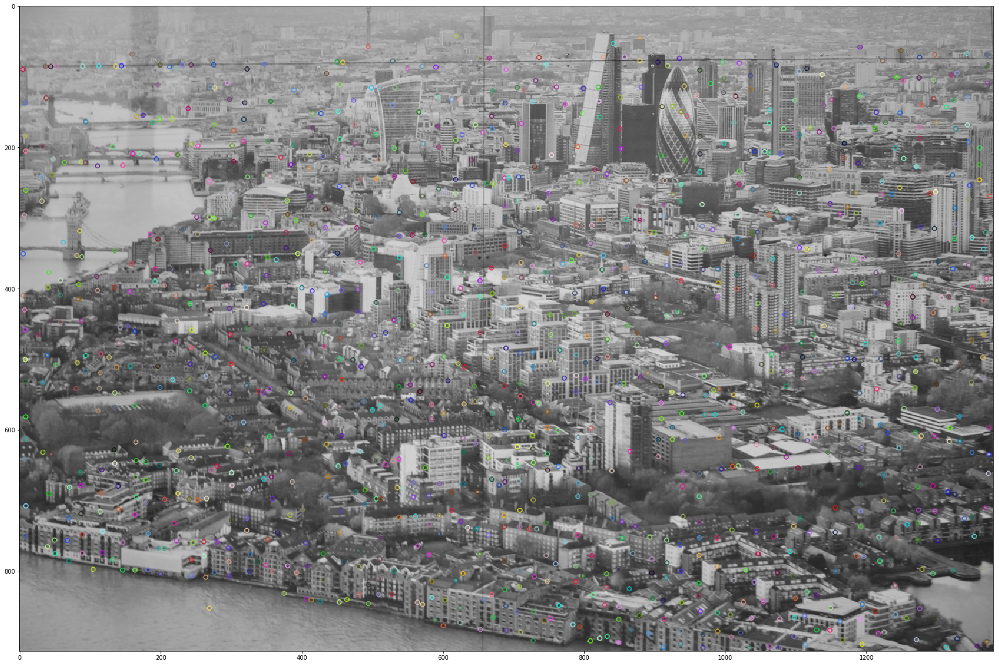

In [257]:
plt.figure(figsize=(30,30))
plt.imshow(gray_with_kp_removed_overlapping_patches)
plt.show()

### DRUGI NACIN

In [239]:
flagged_keypoints = []

for id1, point1 in enumerate(unique_points):
    if id1 in flagged_keypoints:
        continue
    for id2, point2 in enumerate(unique_points[id1+1:]):
        if (id1+id2+1) in flagged_keypoints:
            continue
        if calculate_overlapping_area(point1.pt,point2.pt) > 0.5:
            flagged_keypoints.append(id1+id2+1)

KeyboardInterrupt: 

In [234]:
unique_points_remove_overlap = [point for id1, point in enumerate(unique_points) if id1 not in flagged_keypoints]

In [238]:
len(unique_points_remove_overlap)

673

In [235]:
gray_with_kp_removed_overlapping_patches = cv2.drawKeypoints(gray,
                                                             unique_points_remove_overlap, 
                                                             cv2.DRAW_MATCHES_FLAGS_DEFAULT)

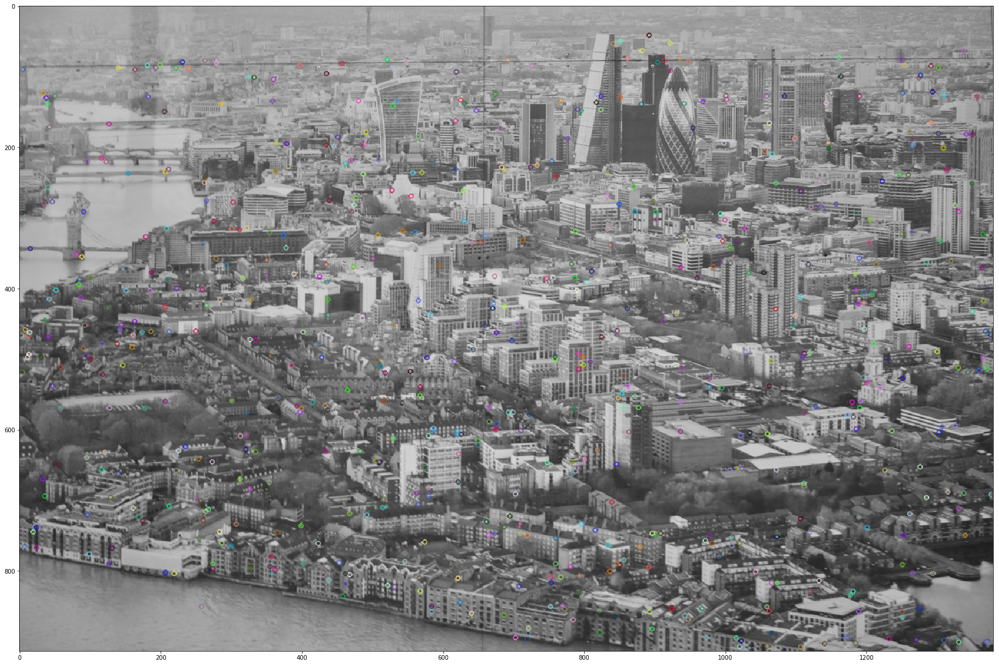

In [236]:
plt.figure(figsize=(30,30))
plt.imshow(gray_with_kp_removed_overlapping_patches)
plt.show()

### USPOREDBA 2 METODE

In [ ]:
set(unique_points_remove_overlap) == set(unique_points_without_overlapping_patches)

In [177]:
lista1 = [1,2,3,4,5]

In [215]:
lista1[4], lista1[2] = lista1[2], lista1[4]

In [158]:
last_index = len(lista1)-1

for id1,l1 in enumerate(lista1):
    if id1 == last_index:
            break
    for id2, l2 in enumerate(lista1[(id1+1):last_index]):
        while pov(l1,l2) > threshold:
            lista1[id1+id2+1], lista1[last_index] = lista1[last_index], lista1[id1]
            last_index -= 1
            l2 = lista1[id1+id2+1]

In [119]:
lista1

[1, 2, 3, 4, 5]

In [106]:
threshold = 200
flagged_keypoints = []
for id1, point1 in enumerate(kp):
    if id1 in flagged_keypoints:
        continue
    for id2, point2 in enumerate(kp[(id1+1):]):
        if (id2+id1+1) in flagged_keypoints:
            continue
        #if np.linalg.norm(np.subtract(point1.pt,point2.pt)) < 22:
        if calculate_overlapping_area(point1.pt,point2.pt) > threshold:
            flagged_keypoints.append(id2+id1+1)

In [108]:
len(flagged_keypoints)

19178

In [111]:
kp_removed_overlapping_patches = [key for id1,key in enumerate(kp) if id1 not in flagged_keypoints ]

In [112]:
gray_with_kp_removed_overlapping_patches = cv2.drawKeypoints(gray,
                                                             kp_removed_overlapping_patches, 
                                                             cv2.DRAW_MATCHES_FLAGS_DEFAULT)

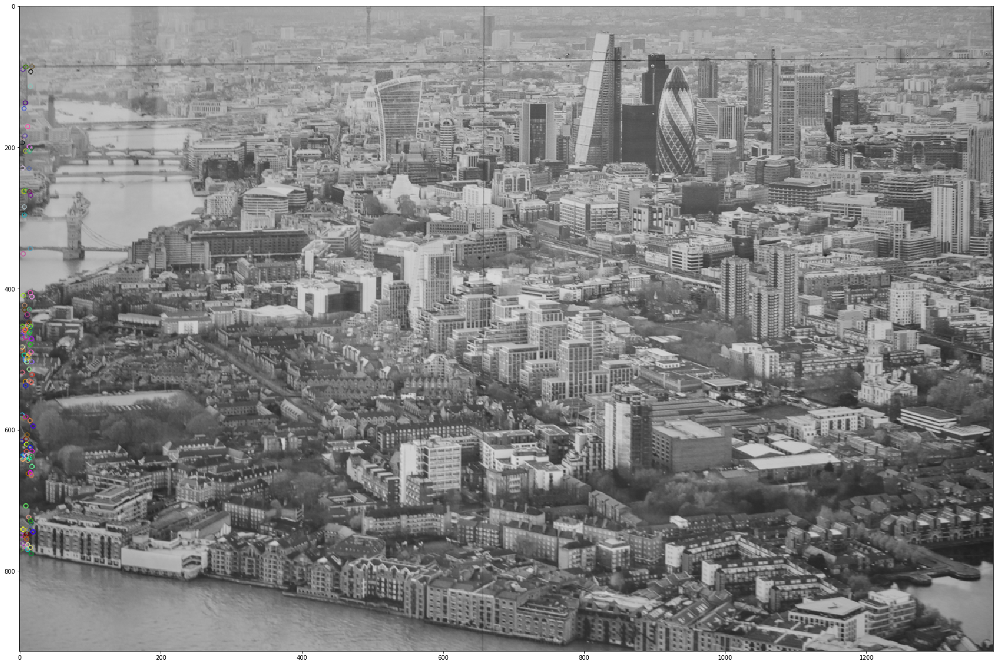

In [113]:
plt.figure(figsize=(30,30))
plt.imshow(gray_with_kp_removed_overlapping_patches)
plt.show()

In [ ]:
for id1, point1 in enumerate(kp):
    abs_differences = [abs(t[idx]-t[idx+1]) for idx in range(len(t)-1)]
    distances = [np.linalg.norm(np.subtract(point1,point2)) for point2 in kp[id1:]]
    

    for id2, point2 in enumerate(kp)

In [66]:
np.linalg.norm(np.subtract(patch1_r,patch2_l))

7.0710678118654755

# HOMOGRAPHY OF KEYPOINTS ON SEQUENCE IMAGES

### GET TRANSFORMATION MATRICES

In [ ]:
transformations_matrices = []

for transf in transformations:
    with open(transf) as file:
        s = file.read()
        nrs = re.split('\n| ',s)[:-1]
        transformations_matrices.append(np.array(nrs).reshape(3,3).astype(np.float))

In [ ]:
transformationstions_matrices

### FIND IMAGED DOTS

In [ ]:
points = np.array([x.pt+(1,) for x in unique_points_without_overlapping_patches])

In [ ]:
dot_one = np.array([400,400,1]).reshape(3,1)

In [ ]:
new_dots = [ np.dot(tr, dot_one) for tr in transformations_matrices]

In [ ]:
>>> a = np.array([[1, 2], [3, 4]])
>>> b = np.array([[5, 6]])
>>> np.concatenate((a, b), axis=0)
array([[1, 2],
       [3, 4],
       [5, 6]])